In [1]:
import numpy as np

In [2]:
r2 = np.load('r2_ml_tree_lightgbm.npy')

In [3]:
r2.shape

(180, 360)

In [8]:
def _get_task_from_regions(num_lat, num_lon, interval):
    """Generate begin index of lat & lon"""
    # config
    lat = np.arange(0, num_lat-1, interval)
    lon = np.arange(0, num_lon-1, interval)
    # generate region
    region = [[int(lat[i]), int(lon[j])]
              for i in range(len(lat))
              for j in range(len(lon))]
    print(len(region))
    return region

In [9]:
region = _get_task_from_regions(180, 360, 18)

200


In [10]:
r2_world = np.full((180,360), np.nan)
for num_jobs, attr in enumerate(region):
    if num_jobs != 199:
        #print('now processing jobs {}'.format(num_jobs))
        r2_world[attr[0]:attr[0]+18, attr[1]:attr[1]+18] = r2[:,:,num_jobs]


In [11]:
r2_world.shape

(180, 360)

In [4]:
import matplotlib.pyplot as plt

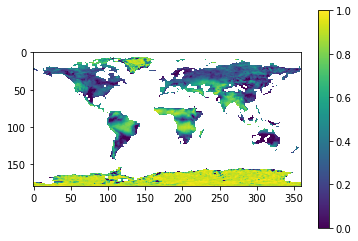

In [5]:
plt.imshow(r2,vmin=0, vmax=1)
plt.colorbar()

In [22]:
r2_world1 = np.concatenate((r2_world[:,181:], r2_world[:,:181]), axis=-1)

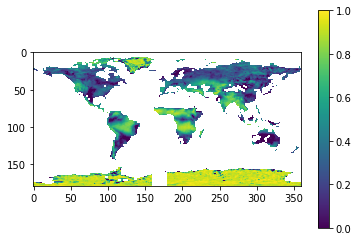

In [23]:
plt.imshow(r2_world1,vmin=0, vmax=1)
plt.colorbar()

In [7]:
from mpl_toolkits.basemap import Basemap

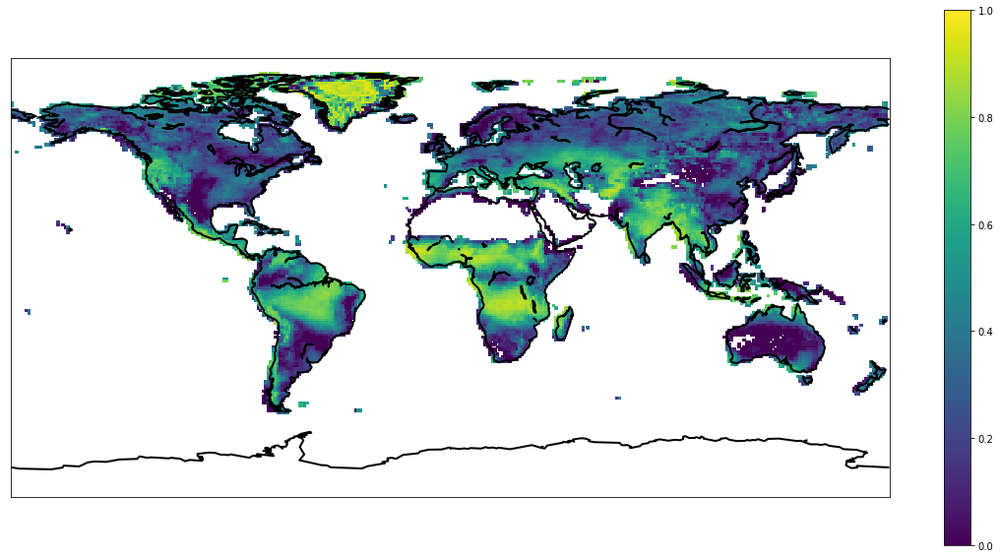

In [9]:
lon, lat = np.meshgrid(np.arange(-180, 180, 1), np.arange(90, -60, -1))
plt.figure(figsize=(20,10))
m = Basemap()
m.drawcoastlines(linewidth=2)

x,y  = m(lon, lat)
sc = m.pcolormesh(x, y, r2[:150, :], vmin=0, vmax=1)
plt.colorbar()
plt.savefig('1.pdf')